#MobileNet()으로 돌림

##### 구글 드라이브에서 Mount 하는 코드

    아래 코드가 모든 인공지능 코드의 뼈대이자 핵심이다.
    이것만 이해하면 Segmentation Code는 충분히 커버가 가능하다.

    아래 사진을 보고 mount() 함수를 이해해보자.

#1. Mount Logic

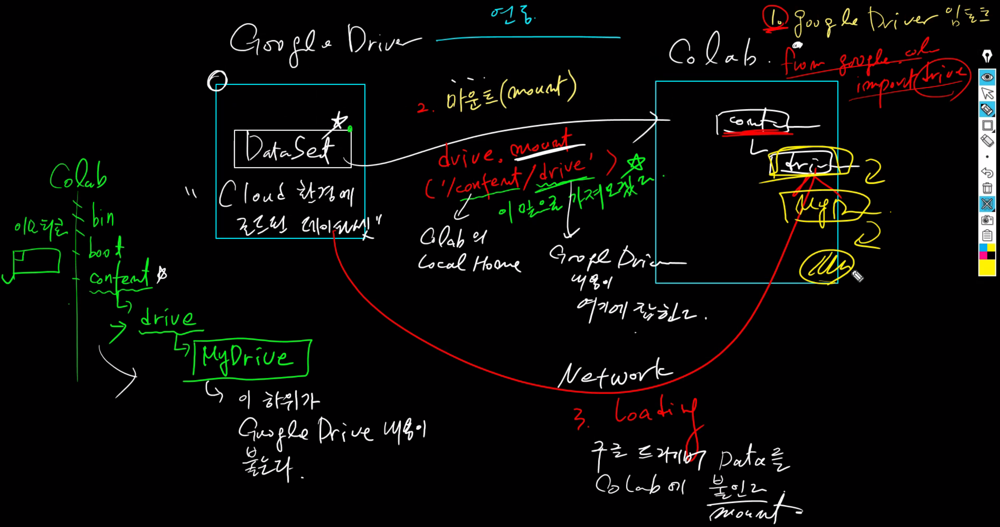

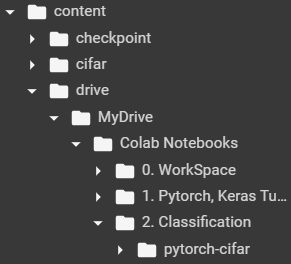

###Mount Logic with code
핵심은 구글 드라이브에 어떻게 코랩으로 가져오느냐가 핵심이다
  
    1. from google.colab import drive >> 구글 코랩의 드라이브 라이브러리 선언
    2. drive.mount('/content/drive') >> 드라이브 마운트.
    3. import_dir ="/content/drive/My Drive/Colab Notebooks/2. Classification/pytorch-cifar" >> 마운트된 드라이브에서 파일경로 선언 (content는 COLAB의 C드라이브라고 보면된다. 저장된 내용들을 모두 볼수 있음)


    네트워크 용량이 아닌 데이터의 갯수로 제한됨!!
    그래서 zip으로 올리고 zip으로 mount해야 한다...

    이미지를 하나하나씩 올리면 매우 오래걸림......
    그러므로 압축형태의 파일을 한번에 올리고 mount해서 작업하는게 훨씬 효율적이다.
    
    아무리 데이터의 용량이 높아도 데이터용량이 작은 파일 여러개 올리는것보다 다운되고 mount되는 시간이 훨씬 짧음

    그리고 local에서 압축을 해제하는것이 최상이다.

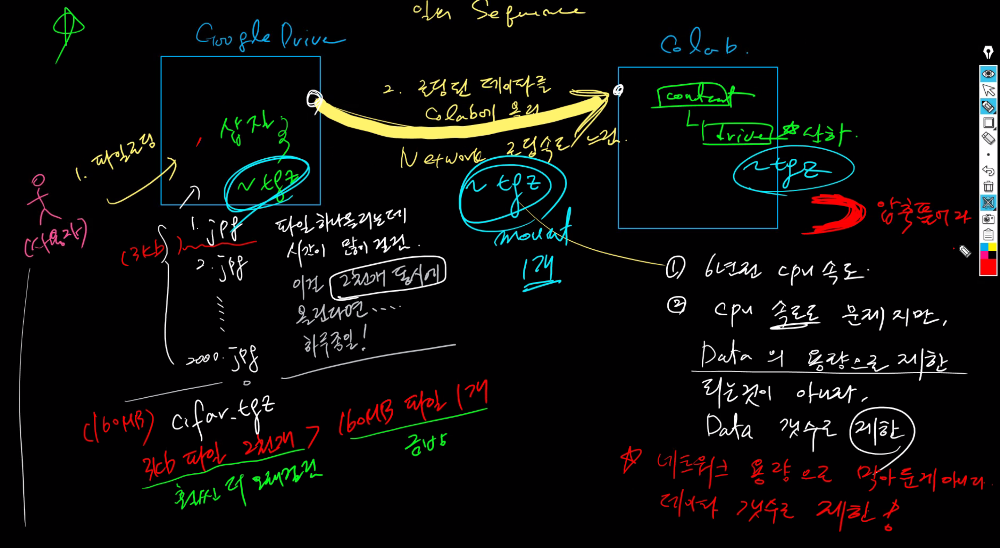

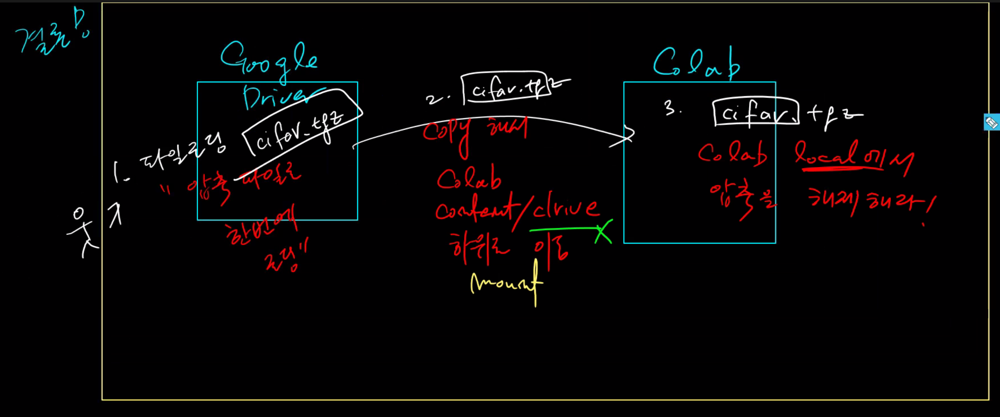

    1. 파일로딩
    2. mount
    3. Local에서 압축 해제.

In [ ]:
# 폴더에서 저장되는 로직을 확인하면서 코드비교를 해보자.

# Mount Google Drive Folder (/content/drive/My Drive/Colab) 
from google.colab import drive # 드라이브를 사용할 것으로 드라이브를 선언해준다.
drive.mount('/content/drive') # mount위치 선언 위치는 항상 drive아래로 들어가야한다.

# import user defined files 
import sys # path할거라 sys를 선언해준다.
import_dir ="/content/drive/My Drive/Colab Notebooks/2. Classification/pytorch-cifar" # 다운 받을 파일의 절대경로를 path할 준비를한다.
sys.path.insert(0, import_dir) # path을 해서 index 0 에 절대경로를 사용해서 파싱해온다.

# import ipynb files...
!pip install import_ipynb # ipynb을 불러오기위해서 불러올수 있는 모듈을 선언 해준다.
import import_ipynb # import는 무조건 현재 Local(content)에서 불러옴 그래서 모듈을 사용한다 한들 안됨..

%run '/content/drive/My Drive/Colab Notebooks/2. Classification/pytorch-cifar/dataset.ipynb' # %run을 사용해서 dataset.ipynb을 불러온다.

import easydict 

args = easydict.EasyDict({ "lr": 0.1, "resume": False}) # 사용 할 params를 설명

# Debugging Tool
import pdb

# Download & Unzip Dataset (Move from google drive to local)
%cp -r '/content/drive/My Drive/Colab Notebooks/Dataset/CIFAR10/cifar.tgz' '/content/sample_data' # copy해서 /content/sample_data에 압축된 파일이 들어가있음.
!tar -xvf  '/content/sample_data/cifar.tgz'# !tar로 압축이 풀린다...... 

# Initilize Additional parameters
train_root = "/content/cifar/train" # 로컬으로 압축이풀린 파일이 저장된다.
test_root = "/content/cifar/test" 

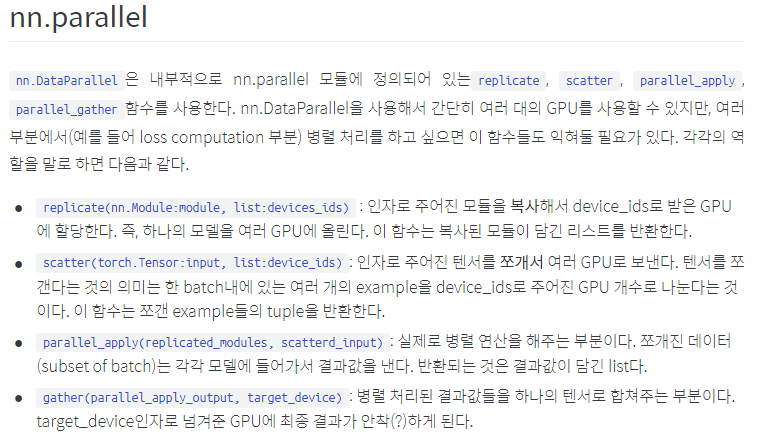

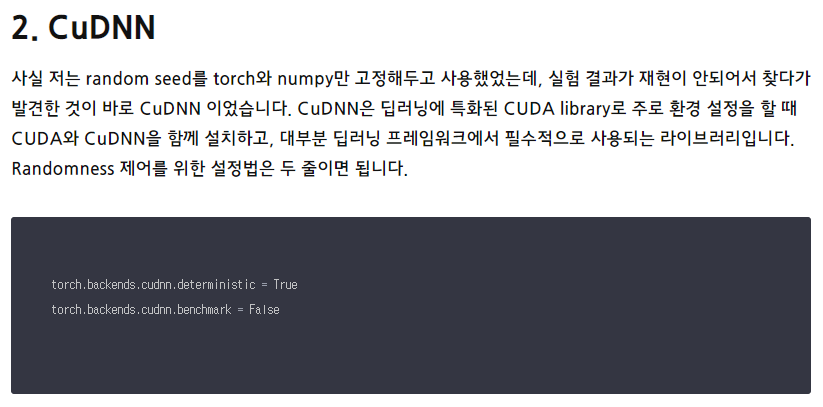

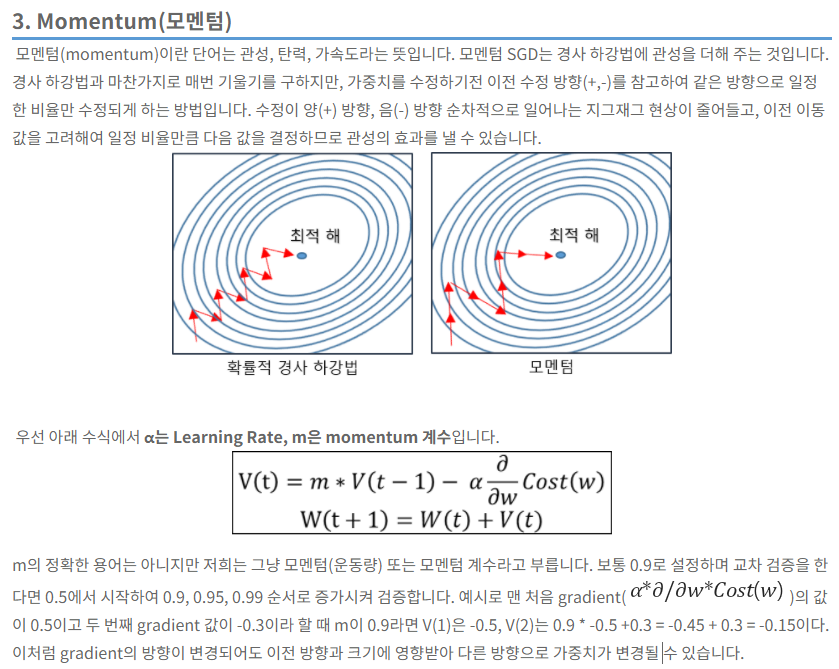

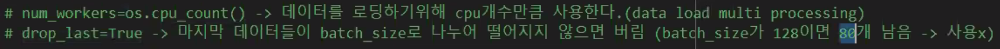

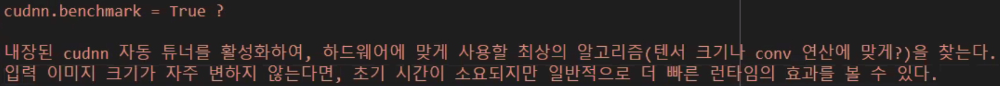

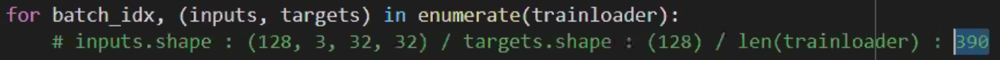

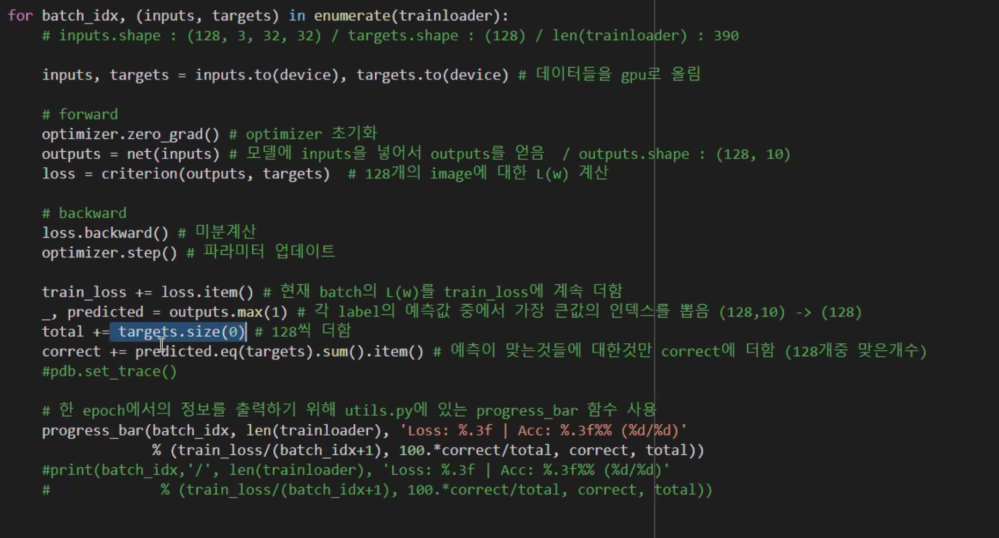

    transforms.RandomCrop(32, padding=4)
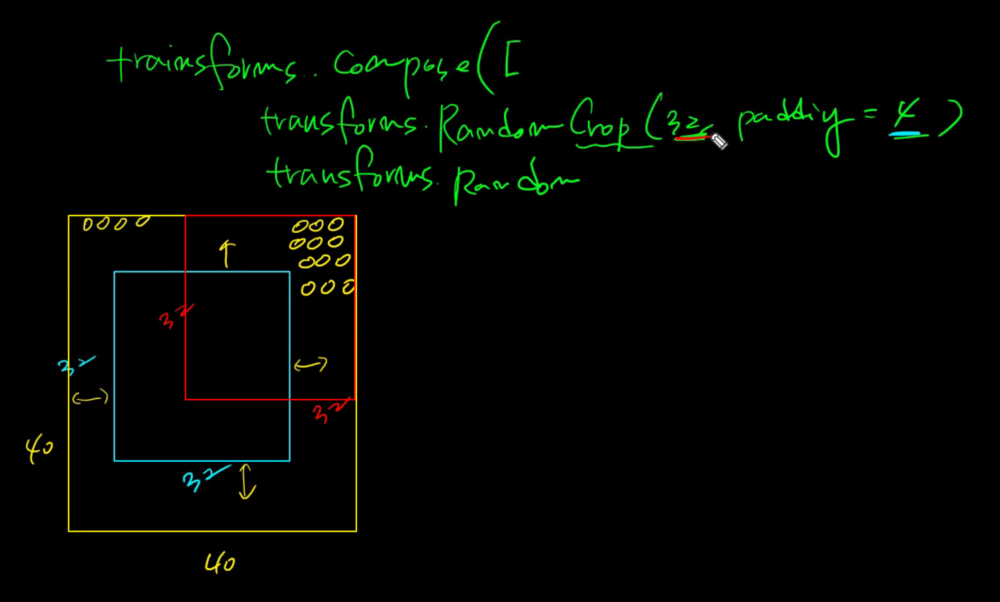

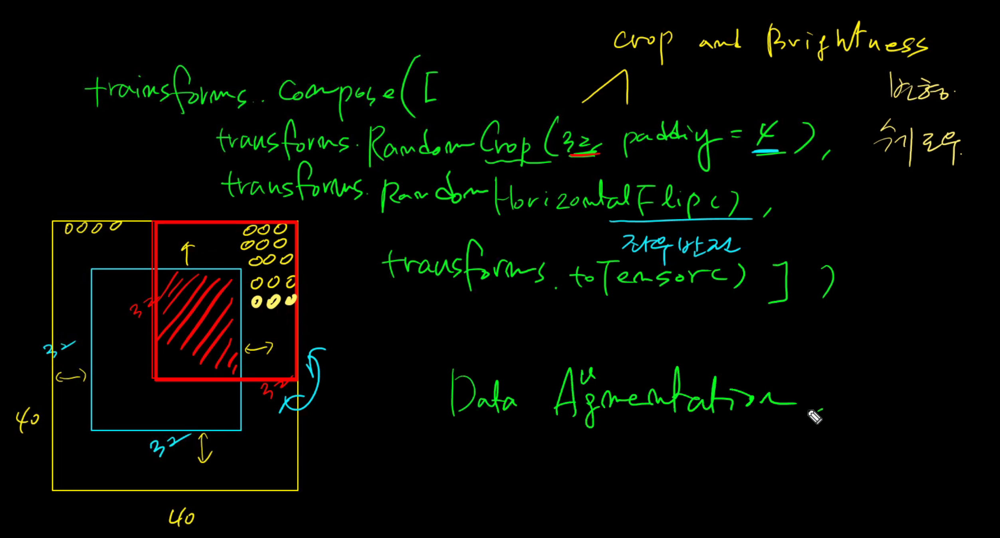

torch.nn.DataParellel() 설명

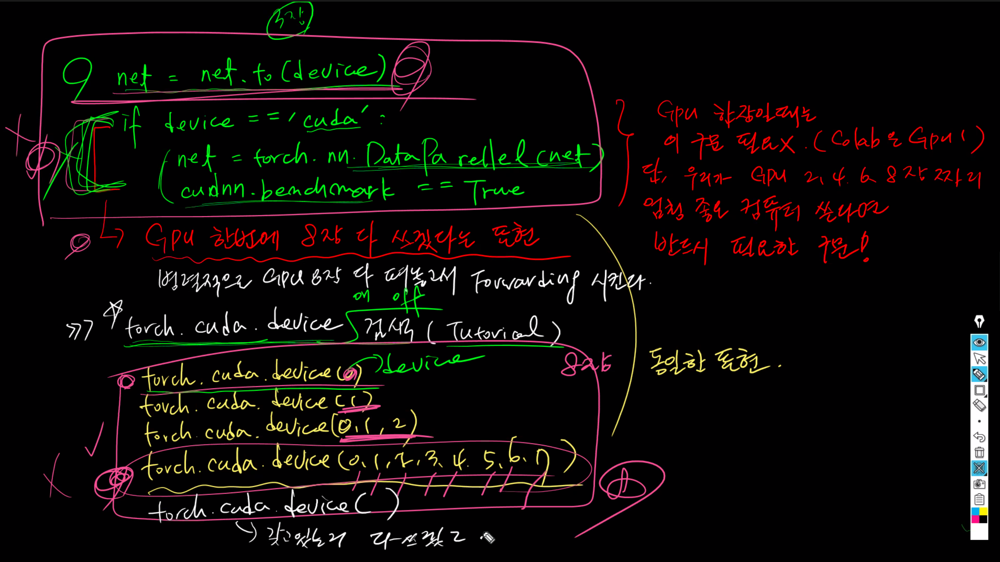

In [ ]:
'''Train CIFAR10 with PyTorch.'''
# 사용할 모듈 선언 해줌 ...
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
import torchvision.transforms as transforms # [statement : 35]에서 사용 Compose[Crop(),HorizontalFlip(),ToTensor(),Normalize()]

import os
import argparse

from models import * # models폴더 있는 모든것을 가져와서 사용하라는 의미이다 + 폴더내부의 순서대로 돌아간다. init.py부터 실행됨 재사용성에 용이함.
from utils import progress_bar

'''
# Removed Code (Because ipynb file does not support argparse)
# Even removed, these lines are substitued by easydict code

parser = argparse.ArgumentParser(description='PyTorch CIFAR10 Training')
parser.add_argument('--lr', default=0.1, type=float, help='learning rate')
parser.add_argument('--resume', '-r', action='store_true',
                    help='resume from checkpoint')
args = parser.parse_args()
'''
args = easydict.EasyDict({ "lr": 0.1, "resume": True}) # 사용 할 params를 설명

device = 'cuda' if torch.cuda.is_available() else 'cpu' # device를 선언 =  엔비디아 cuda GPU사용, 만약 사용못하면 cpu로 전환
best_acc = 0  # best test accuracy, 학습을 진행하면더 가장 높은 Accuracy를 저장할 변수 선언
start_epoch = 0  # 가장 accuracy값이 높은 epoch을 저장해서 스타트 변수 선언 start from epoch 0 or last checkpoint epoch, epoch 시작점 선언 [statement : 93] 참고

# Data Preprocessing
# transforms.Compose 함수로 train Data 변형
print('==> Preparing data..')
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4), # 32사이즈로 랜덤하게 crop하고 각 테두리에 padding을 준다.
    transforms.RandomHorizontalFlip(), # 디폴트값이 0.5 로 50%로 좌우반전
    transforms.ToTensor() # 스케일링, 채널위치변경, 변수형태로 변환
    #transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)), # 명도나 채도등 각 다른 이미지의 환경을 정규화 (평균,표준편차)
])

#test는 연산만 가능하면 되므로 이미지의 x 값들만 스케일링 하고 normalization시켜준다.
transform_test = transforms.Compose([
    transforms.ToTensor()
    #transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# Modified for custom dataset
#trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)
trainset = Dataset(root=train_root, transforms=transform_train) # transforms=transform_train을 인자값으로 넣어 변형시킨 Datafmf set 해준다.
trainloader = torch.utils.data.DataLoader( # Data를 변형된 train데이타인 trainset 으로 할당해주고, batch_size 128, 섞고, 연산하는cpu수를 지정해준다. , drop_last=True로 선언하면서 
    trainset, batch_size=128, shuffle=True, num_workers=os.cpu_count(), drop_last=True)
'''
drop_last를 하는 이유를 이해하기 위해서 1,000개의 데이터가 있다고 했을 때, 배치 크기가 128이라고 해봅시다.
 1,000을 128로 나누면 총 7개가 나오고 나머지로 104개가 남습니다.
  이때 104개를 마지막 배치로 한다고 하였을 때 128개를 충족하지 못하였으므로 104개를 그냥 버릴 수도 있습니다. 
  이때 마지막 배치를 버리려면 drop_last=True를 해주면 됩니다.
  drop_last=True로 가야함... 이유는
   이는 다른 배치보다 개수가 적은 마지막 배치를 경사 하강법에 사용하여 마지막 배치가 상대적으로 과대 평가되는 현상을 막아줍니다.
'''

# Modified for custom dataset
#testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_test) 이 코드 대신 custom데이타셋이므로 아래 코드를 사용한다.
testset = Dataset(root=test_root, transforms=transform_test) # 데이타셋에 정의된 클래스를 override해서 사용 이미지가 저장된.
testloader = torch.utils.data.DataLoader(
    testset, batch_size=100, shuffle=False, num_workers=os.cpu_count(), drop_last=True)

classes = ('plane', 'car', 'bird', 'cat', 'deer',# 클래스의 라벨들
           'dog', 'frog', 'horse', 'ship', 'truck') 

print('==> Building model..')
# net = VGG('VGG19')
# net = ResNet18()
# net = PreActResNet18()
# net = GoogLeNet()
# net = DenseNet121()
# net = ResNeXt29_2x64d()
net = MobileNet() # 가장 가벼운 Neural Net 으로 학습을 진행 해보자
# net = MobileNetV2()
# net = DPN92()
# net = ShuffleNetG2()
# net = SENet18()
# net = ShuffleNetV2(1)
# net = EfficientNetB0()
# net = RegNetX_200MF()



net = net.to(device) # 위에 선언된 device 즉 GPU를 사용해서 Neural Net 연산을 사용한다 선언. [statement : 121]

if device == 'cuda': # device가 cuda이면,,,
    # DataParallel의 내장함수로 replicate, scatter, apply, gather의 함수를 사용하는데

    # gpu가 여러개 일때 학습 속도가 굉장히 빨라진다.~!! 중요하므로 꼭 알고 있어야 한다.
    net = torch.nn.DataParallel(net) # MobileNet() GPU가 여러개 일때 필요한 구문이다. (지금 우리는 gpu를 1개 사용하므로 필요없는 구문)
    
    cudnn.benchmark = True # 내장된 Cudne Auto Tunner를 사용하여 하드웨어에 가장 적합한 알고리즘을 찾음.

if args.resume: # checkpoint에 저장된 체크포인트에서 재실행 하는 코드
    # Load checkpoint.
    print('==> Resuming from checkpoint..')   
    assert os.path.isdir('checkpoint'), 'Error: no checkpoint directory found!'   
    checkpoint = torch.load('./checkpoint/ckpt.pth')
    
    net.load_state_dict(checkpoint['net']) # load_state_dict로 딕셔너리 형태로 불러온다. checkpoint에서 'net'을 업데이트해줌.
    best_acc = checkpoint['acc'] # checkpoint에 저장된 acc를 불러온다. checkpoint는 항상 best 만 저장하므로 변수명을 best_acc으로 선언.
    start_epoch = checkpoint['epoch'] # arguments = 여러개의 인자를 함수로 받고자 할때 사용된다

criterion = nn.CrossEntropyLoss() # 우리가 배운 loss_function과 같음...  criterion으로 선언 즉 loss값을 가져온다. multi_label이므로 CrossEntropyLoss() 를사용
optimizer = optim.SGD(net.parameters(), lr=args.lr, # optimizer로 SGD(확률적 경사 하강법)를 사용한다. net.parameters()에 w,b가 인자값으로 있어서 변경해준다. 즉, 해킹.., 
                      momentum=0.9, weight_decay=5e-4) # loss를 계산하는 기준을 args.lr으로 정의한다
'''
momentum 은 가중치를 수정하기전 이전 수정 방향(+,-)를 참고하여 같은 방향으로 일정한 비율만 수정되게 하는 방법이다. 보통 0.9선언한다.
weight decay는 weight들의 값이 증가하는 것을 제한함으로써, 모델의 복잡도를 감소시킴으로써 제한하는 기법,
 즉 weight를 decay 시켜서 Overfitting을 방지하는 기법이다.
'''

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net.train() # train모드로 변경
    train_loss = 0 # train하면서 가장 낮은 loss값을 저장한 변수 선언.
    correct = 0 # 비교해서 맞은 갯수를 저장할 변수 선언.
    total = 0 # 데이터의 전체 갯수를 저장할 변수 선언.

    for batch_idx, (inputs, targets) in enumerate(trainloader): # trainloader에서 Dataset class에서 getItem()을 100번 실행함. 그리고 image100개, label100개가 패키징된걸 (inputs, targets)으로 받음
                                                                # batch_idx, (inputs(128,3,32,32), targets(128))을 리턴 
        # inputs = torch.Size([128, 3, 32, 32]),targets = torch.Size([128])
        inputs, targets = inputs.to(device), targets.to(device) # gpu로 연산할 것을 선언

        # forward
        optimizer.zero_grad()
        '''
        PyTorch는 미분을 통해 얻은 기울기를 이전에 계산된 기울기 값에 누적시키는 특징이 있다. 
        그렇기 때문에 optimizer.zero_grad()를 통해 미분값을 계속 0으로 초기화시켜줌.
        '''
        outputs = net(inputs) #학습을 진행 시켜 prediction값을 outputs(128,10)으로 받아옴
        loss = criterion(outputs, targets) # 예측값(128개)을 실제 target들과 비교하여 loss(L(w))값 추출

        # backward
        loss.backward() # 추출된 loss값을 backward시켜서 renew시켜줌 backward = 편미분 즉,loss와 chain rule을 활용하여 모델의 각 레이어에서 gradient(w)를 계산함,
        optimizer.step() # Optimizer의 step 함수를 호출하면 매개변수가 renew된다.

        # 변수에 값을 더함
        train_loss += loss.item() # train_loss에 loss((L(w)))값을 더함
        _, predicted = outputs.max(1) # value, index중 value값은 메모리에 저장하지 않고, outputs(128,10)에서 가장 예측값이 높은 index만 뽑아옴
        total += targets.size(0) #  targets(128)갯수를 더함 즉, 총 데이터의 갯수이다.
        correct += predicted.eq(targets).sum().item() # correct에 predicted로 맞은 갯수 저장 eq는 교육지수를 말한다.
        # pdb.set_trace()

        progress_bar(batch_idx, len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                     % (train_loss/(batch_idx+1), 100.*correct/total, correct, total)) # progress_bar를 그려서 UI를 그려줌 어떻게 변하는지 보여줌
        #print(batch_idx,'/', len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
        #             % (train_loss/(batch_idx+1), 100.*correct/total, correct, total))

# Test
def test(epoch):
    global best_acc # best_acc를 global화시켜서 [statement : 104]에 저장된 checkpoint['acc']를 불러온다.
    net.eval() # 평가모드로 전환
    test_loss = 0
    correct = 0
    total = 0
    with torch.no_grad(): # 테스트 메모리를 할당하지 않겠다고 선언한다. 
    # 전체적인 logic은 Train과 같다.
        for batch_idx, (inputs, targets) in enumerate(testloader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = net(inputs)
            loss = criterion(outputs, targets)

            test_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))
            #print(batch_idx,'/', len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
            #             % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))

    # Save checkpoint.   
    acc = 100.*correct/total 
    if acc > best_acc: # 위 test함수를 진행할때 나온 accuracy가 기존의 저장된 best_acc 보다 높으면 checkpoint renew시킨다
        print('Saving..')
        state = {
            'net': net.state_dict(),
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir('checkpoint'): # local에 checkpoint폴더가 없으면
            os.mkdir('checkpoint') # 새로 만들어줌.
        torch.save(state, './checkpoint/ckpt.pth') # 성능좋은 loss값이 저장될때 그때 당시의 내용들을 딕셔너리형태로 저장한다. weight값 저장된다.
        best_acc = acc # best_acc을 acc으로 renew 됨.

for epoch in range(start_epoch, start_epoch+100):
    train(epoch)
    test(epoch)

In [ ]:
# 끊김 방지 코드 
while 1:
    continue

In [ ]:
trainloader